Elaborado por: Yurley Tatiana Prieto
               y Juan Jose Ardila

# Clasificación de clases y segmentación con K-Mean

Para este trabajo se realizó un análisis de una zona del noreste de Colombia, donde es posible detallar distintas coberturas y que permite entrenar distintos modelos.

A continuación, se muestran los pasos realizados para lograr estos procesos con los modelos de Random Forest con K-Mean como covariable.


# Importación de modulos

In [5]:
# Import modules from python standard library
import os
import pprint
import random

# Import Geopandas for vector analysis (https://geopandas.org)
import geopandas

# Import the matplotlib plotting module and set it to work within
# a notebook environment.
%matplotlib inline
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Import the RSGISLib modules for the notebook
import rsgislib
import rsgislib.classification
import rsgislib.classification.classsklearn
import rsgislib.tools.filetools
import rsgislib.tools.mapping
import rsgislib.tools.plotting
import rsgislib.vectorutils
import rsgislib.zonalstats
from sklearn.ensemble import RandomForestClassifier

# scikit-learn imports
from sklearn.model_selection import GridSearchCV

# Standard and scientific libraries
import numpy as np
import rasterio as rio
import rasterio.windows as rwin
from rasterio.mask import mask

# Machine-learning tools
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Image-enhancement for visual interpretation
from skimage.exposure import equalize_adapthist

## Cargar conjuntos de datos y generar un subconjunto de trabajo

Previo a la generación de la clasifiación no supervisada con el algortimo K-Mean, se prepara la informaicón del aprea de estudio, sin embargo, para este caso se genera un área de interes, la cual contiene una alta cantidad de muetsreos para realizar la clasificaci+on, reduciendo así el área original, para evitar un sobegasto de computo.

Para este caso con el área de interes, se genera un subconjunto de 5500 x 5500 px, a partir de su centro y se almacena en una nueva imagen, para su facil manejo y entrenamiento posterior.


In [6]:
# Ruta base
m_root = '/notebooks/Workshop_5'
raster_path = os.path.join(m_root, 'datos/sentinel_median_16bit.tif')
subset_path = os.path.join(m_root, 'subset_by_shape1.tif')


In [7]:
# Cargar shapefile o GPKG (asegúrate que tenga mismo CRS que el raster)
aoi = geopandas.read_file(os.path.join(m_root, 'datos/new_layer.shp'))  # o 'aoi.gpkg'

# Asegurar que esté en el mismo CRS que el raster
with rio.open(raster_path) as src:
    aoi = aoi.to_crs(src.crs)  # reproyectar si es necesario
    out_image, out_transform = mask(src, aoi.geometry, crop=True)
    out_meta = src.meta.copy()

out_meta.update({
    "driver": "GTiff",
    "height": out_image.shape[1],
    "width": out_image.shape[2],
    "transform": out_transform,
    "compress": "lzw",
    "tiled": True
})

# Guardar el subset
with rio.open(subset_path, "w", **out_meta) as dest:
    dest.write(out_image)

print("Subset recortado por shapefile guardado en →", subset_path)


Subset recortado por shapefile guardado en → /notebooks/Workshop_5/subset_by_shape1.tif


## Previsualización de los datos

Es posible, detallar como se relacionan los valores de reflectancia de los pixeles de las bandas de la imagen original, que se detallan en la siguiente tabla mediante un diagrama de dispersión.

| **Banda Sentinel-2** | **Banda relativa** | **Descripción**                   |
| -------------------- | ------------------ | --------------------------------- |
| **B2**               | Banda 1            | Azul                              |
| **B3**               | Banda 2            | Verde                             |
| **B4**               | Banda 3            | Rojo                              |
| **B5**               | Banda 4            | Red edge 1                        |
| **B6**               | Banda 5            | Red edge 2                        |
| **B7**               | Banda 6            | Red edge 3                        |
| **B8**               | Banda 7            | Infrarrojo cercano (NIR)          |
| **B11**              | Banda 8            | Infrarrojo de onda corta (SWIR 1) |
| **B12**              | Banda 9            | Infrarrojo de onda corta (SWIR 2) |

Adicionalmente, se genera una combinación en color verdadero, para detallar el área definida de estudio y dar una identificaicón inical de los elementos presentes. Esto se complementa con un suvie estiramiento lineal, que ayuda a equilibrar la imagen, que ayuda a evitar los valore satipicos, que tambien son visibles en el digrama de dispersión.


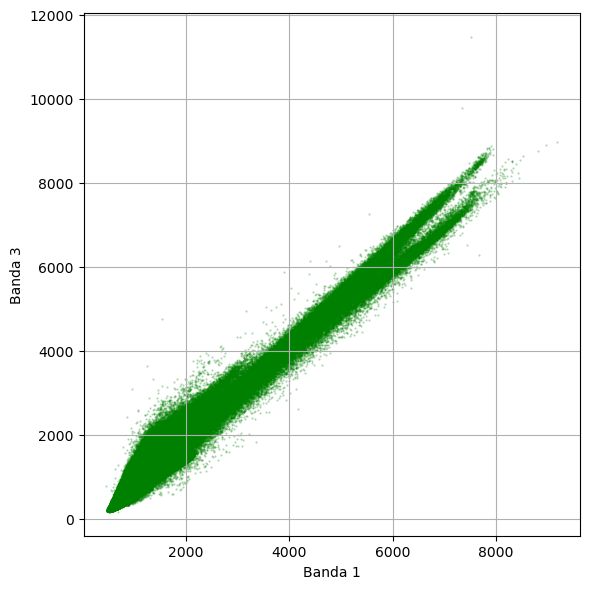

In [5]:
with rio.open(subset_path) as src:
    banda1 = src.read(1).astype(float)  # por ejemplo: banda azul
    banda3 = src.read(3).astype(float)  # por ejemplo: banda roja

# Aplanar las bandas
x = banda1.flatten()
y = banda3.flatten()



# Crear scatterplot
plt.figure(figsize=(6, 6))
plt.scatter(x, y, s=0.3, alpha=0.3, color='green')
plt.xlabel("Banda 1")
plt.ylabel("Banda 3")
# plt.title("Scatterplot: Banda 1 vs Banda 3")
plt.grid(True)
plt.tight_layout()
plt.show()

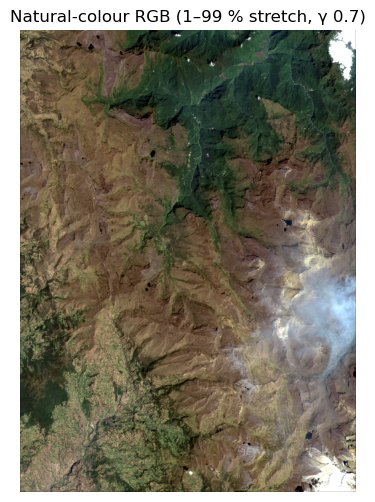

In [8]:
#· RGB preview (bands 4-3-2 )
with rio.open(subset_path) as src:
    img = src.read()

bands_rgb = (3, 2, 1)                            # R-G-B (1-based)
gamma     = 0.7                                 # contrast tweak

channels = []
for b in bands_rgb:
    band = img[b-1].astype(float)
    lo, hi = np.percentile(band, (1, 99))
    band = np.clip((band - lo) / (hi - lo), 0, 1)
    channels.append(band)

rgb = np.dstack(channels) ** gamma

plt.figure(figsize=(6, 6))
plt.imshow(rgb)
plt.title("Natural-colour RGB (1–99 % stretch, γ 0.7)")
plt.axis("off")
plt.show()


## Clase ClusteredStack

Estas funciones definidas encapsulan el proceso de la clasifiación no supervisada con el formato par K-Mean.


In [9]:
# %% Listings 5-7 completos (adaptados)
class ClusteredStack:
    
    def __init__(self, raster_path): # Initialises the class instance.
        self.raster_path = raster_path # path to the multiband GeoTIFF (e.g., the 400×400 subset).  
        self.model_input = None #    the reshaped data matrix  
        self.height = self.width = self.depth = 0 # image dimensions
        self.k_range = [] # List of all k-values (number of clusters) to evaluate
        self.models = [] # Trained KMeans models for each k; stored for later inspection
        self.predicted_rasters = [] # Cluster label images (reshaped to raster size)
        self.inertia_scores = [] # Inertia values (sum of squared distances within clusters); used for Elbow method
        self.silhouette_scores = [] # Silhouette scores (measure of cluster separation); used for model selection

    
    def set_raster_stack(self):
        """Reads the raster and reshapes it into a format suitable for K-Means."""
        with rio.open(self.raster_path) as src:

            # Read all bands into a 3D NumPy array of shape (bands, rows, cols)
            stack = src.read()

             # Replace any NaN (Not-a-Number) values with zero. Avoids errors during clustering algorithms, which cannot handle NaNs
            stack = np.nan_to_num(stack)   
        # Extract the number of bands, rows, and columns from the raster's shape
        # These values are stored as object attributes for later use
        self.depth, self.height, self.width = stack.shape

        # Reshape the 3D array into a 2D matrix of shape (n_pixels, n_bands)
        # Each row now corresponds to one pixel, and each column to a spectral band
        # Transposition (.T) ensures the matrix has the correct shape for scikit-learn
        self.model_input = stack.reshape(self.depth, -1).T


    def build_models(self, k_values):
        """
            Trains one K-Means clustering model for each value of k provided in k_values.
         It stores the resulting models, cluster labels, and evaluation metrics.
        """

        # Convert the input iterable into a list and store it
        # This list defines the number of clusters to be tested (e.g. [3, 4, 5, ..., 10])
        self.k_range = list(k_values)

        # Initialise empty lists to store models, results, and metrics
        self.models, self.predicted_rasters = [], [] # Trained KMeans objects  - Cluster label images (reshaped to raster form)
        self.inertia_scores, self.silhouette_scores = [], [] # Inertia values for each k - # Silhouette scores for each k

        for k in self.k_range:

            # Create a KMeans model with k clusters
            # random_state ensures reproducibility; n_init specifies how many times the algorithm will run with different centroid seeds
            km = KMeans(n_clusters=k, random_state=42, n_init=10)

             # Fit the model to the reshaped raster and predict the cluster labels
             # This returns one label (cluster ID) per pixel
            labels = km.fit_predict(self.model_input)

            # Store the trained model
            self.models.append(km)

            # Record the inertia for this k (lower is better; used in Elbow method)
            self.inertia_scores.append(km.inertia_)

            # Calculate and store the silhouette score for this k
            # A higher silhouette score indicates better-defined clusters
            # Sampling is limited to 1000 points for performance reasons
            self.silhouette_scores.append(
                silhouette_score(self.model_input, labels, sample_size=1000)
            )

            # Reshape the flat list of labels back to image form (rows × cols)
            # This is required for visualising the classified image later
            self.predicted_rasters.append(labels.reshape(self.height, self.width))


    def show_clustered(self, cmap="Accent"):
        """
        Displays one classified raster image for each value of k.
        Each image uses a categorical colourmap for easy interpretation.
        """
        for k, img_cls in zip(self.k_range, self.predicted_rasters):
            plt.figure(figsize=(5, 5))
            plt.imshow(img_cls, cmap=cmap)
            plt.title(f"{k} clusters")
            plt.axis("off")
            plt.colorbar()
            plt.show()

    def show_inertia(self):
        """
        Plots the inertia values for each k to apply the Elbow method.
        Inertia measures how tightly the data points are clustered around their centroids.
        Lower values indicate more compact clusters.
        """
        plt.figure(figsize=(5, 4))
        plt.plot(self.k_range, self.inertia_scores, "o-")
        plt.xlabel("Number of clusters (k)")
        plt.ylabel("Inertia")
        plt.title("Elbow method")
        plt.show()

    def show_silhouette(self):
        """
        Plots the silhouette scores for each k to assess clustering quality.
        Silhouette score ranges from -1 to 1, with higher values indicating
        better-defined, well-separated clusters.
        """
        plt.figure(figsize=(5, 4))
        plt.plot(self.k_range, self.silhouette_scores, "o-")
        plt.xlabel("Número de clusters (k)")
        plt.ylabel("Silhouette Coeff.s")
        plt.title("Silhouette scores")
        plt.show()


In [ ]:
Posteriomente, es aqupi donde s egenera el entrenamiento para la imagen con el algortimo definido de K-Means probando las K 
entre 3 a 10 y obteniendo dos metricas, una de inercia y la segunda de silhouette.


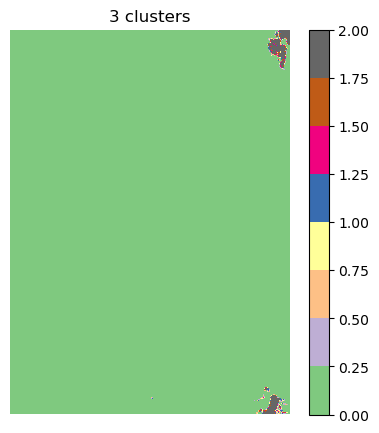

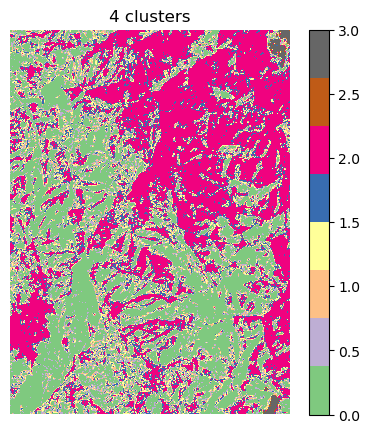

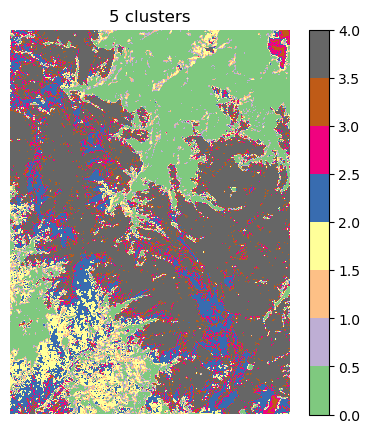

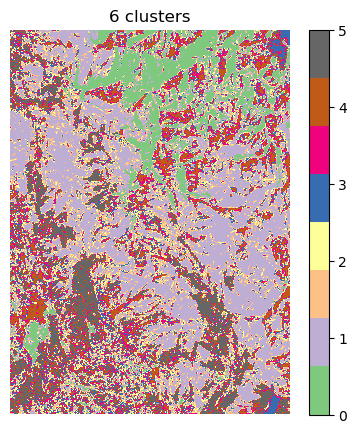

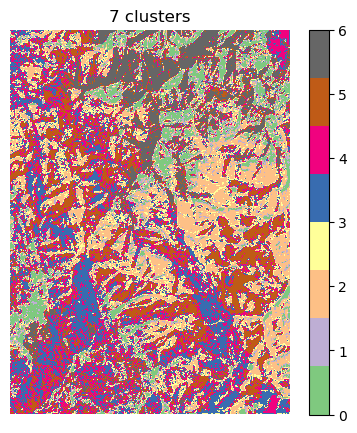

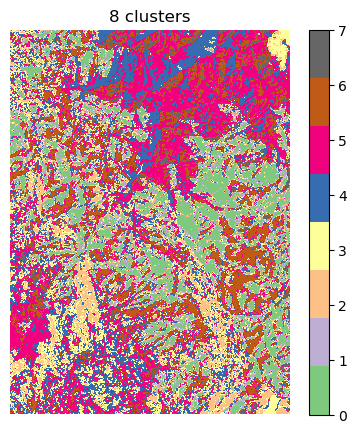

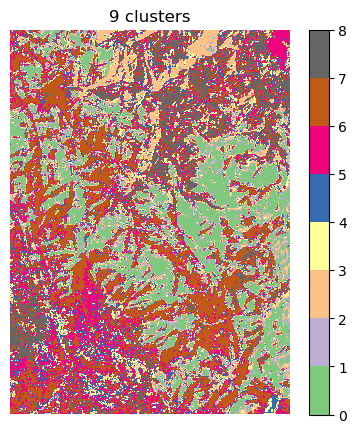

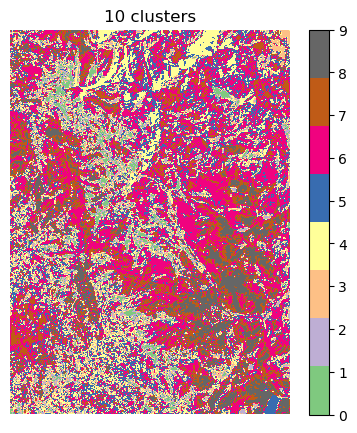

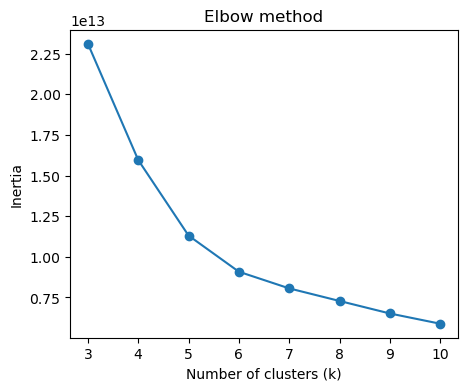

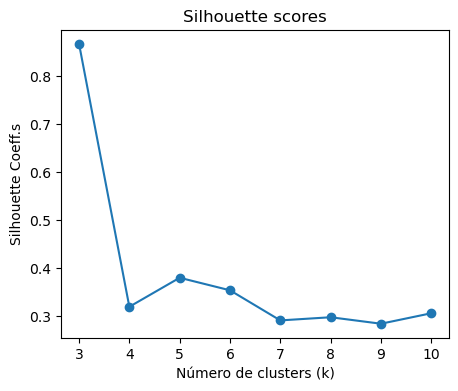

In [10]:
clustered_models = ClusteredStack(subset_path)

clustered_models.set_raster_stack()

ranges = np.arange(3, 11, 1)

clustered_models.build_models(ranges)

clustered_models.show_clustered()
clustered_models.show_inertia()

ClusteredStack.show_silhouette_scores = ClusteredStack.show_silhouette
clustered_models.show_silhouette_scores()


In [ ]:
##


In [14]:
import numpy as np

# === Paso 1: Entrenar el modelo k-means con k=5 ===
clustered_models = ClusteredStack(subset_path)
clustered_models.set_raster_stack()
clustered_models.build_models([5])  # Entrena solo para k=5

# === Paso 2: Obtener la imagen de clúster resultante para k=5 ===
cluster_labels = clustered_models.predicted_rasters[0]  # índice 0 = k=5

# === Paso 3: Obtener el stack de bandas original ===
raster_stack = clustered_models.model_input             # (rows, cols, bands)

# X ya es el raster aplanado (n_pixels, n_bands)
X = raster_stack

# y debe ser la imagen clasificada correspondiente a esos píxeles
y = cluster_labels.flatten()

# Filtrar solo la clase 5
X_class5 = X[y == 5]
y_class5 = y[y == 5]

In [15]:
import rasterio as rio

# Abrir raster de referencia
with rio.open(subset_path) as src:
    profile = src.profile.copy()
    transform = src.transform
    crs = src.crs

# Ajustar perfil para imagen de una sola banda de tipo uint8
profile.pop("nodata", None)  # Elimina el campo 'nodata' si existe
profile.update(
    dtype=rio.uint8,
    count=1,
    compress='lzw'
)

# Guardar la imagen de KMeans
kmeans_img = "kmeans_class2.tif"
with rio.open(kmeans_img, "w", **profile) as dst:
    dst.write(cluster_labels.astype(rio.uint8), 1)

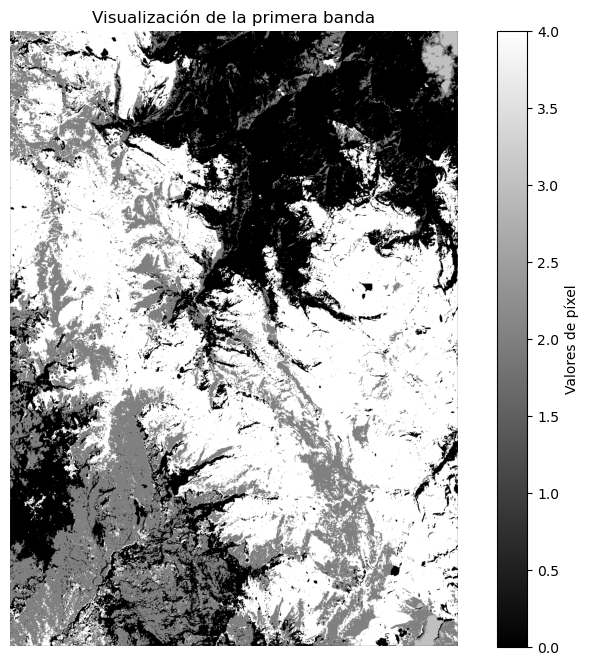

In [16]:
tif_path = "/notebooks/Workshop_5/kmeans_class2.tif"

# Abrir y leer el raster
with rio.open(tif_path) as src:
    img = src.read(1)  # Lee la primera banda (puedes cambiar el número)

# Mostrar la imagen
plt.figure(figsize=(10, 8))
plt.imshow(img, cmap='gray')  # Puedes usar otros colormaps como 'viridis', 'RdYlGn', etc.
plt.title("Visualización de la primera banda")
plt.colorbar(label='Valores de píxel')
plt.axis('off')
plt.show()

# Información de entrada

Declare the **core inputs** for the classification exercise:

| Variable | File | Purpose |
|----------|------|---------|
| input_img | sentinel_median_16bit.tif | Imagen multiespectral Sentinel-2 con EPSG 3116, para poder trabajar en valores métricos y sobre el área de estudio. |
| in_msk_img | sentinel_median_16bit_Mask2_RESAMPLED.tif | Máscara que valida los valores de la imagen multiespectral. |
| vec_train_file | Prueba_clase1.gpkg | Vector de entrenamiento que cuenta con las zonas caracterizadas para las coberturas incluidas. |


In [19]:
input_img = "/notebooks/Workshop_5/subset_by_shape1.tif"

in_msk_img = "/notebooks/Workshop_5/subset_by_shape1_Mask.tif"

vec_train_file = "/notebooks/Workshop_5/Prueba_clase1.gpkg"

# Exploración de la información


In [20]:
lyr_names = rsgislib.vectorutils.get_vec_lyrs_lst(vec_train_file)
print(lyr_names )


['forest', 'shrub_or_herbaceous_vegetation', 'sparsely_or_no_vegetated_areas', 'water_bodies', 'shadow', 'ice_and_snow', 'clouds', 'artificial_surfaces']


## Visualización de la información

A continuación se da una visualización de la información de la imagen multiespectral frente a la información de entrenamiento.


In [21]:
img_bbox = rsgislib.imageutils.get_img_bbox(input_img)
print(img_bbox)

(1168140.0, 1197750.0, 1210750.0, 1251470.0)


Image Data Size: 2961 x 4072


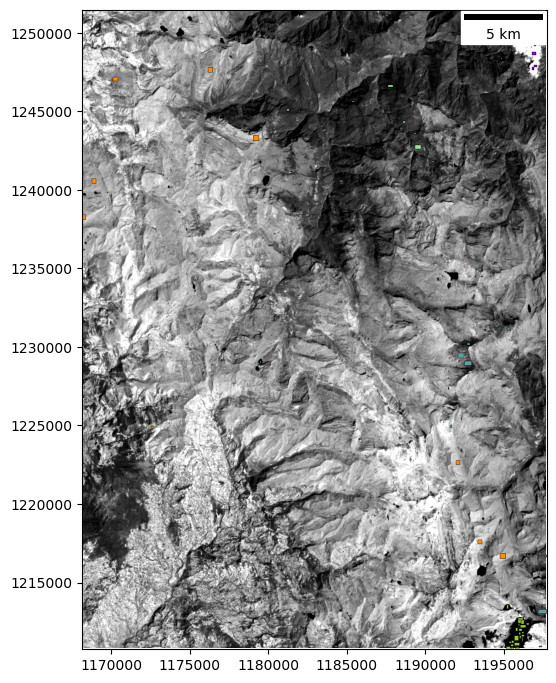

In [23]:
# 1. Definición de la ventana de la imagen
sub_img_bbox = [1168140.0, 1197750.0, 1210750.0, 1251470.0]

# 2. Preparación del lienzo
fig, ax = plt.subplots(figsize=(6, 9))

# 3. Dibujo de una composición de la imagen
rsgislib.tools.mapping.create_raster_img_map(
    ax,
    input_img,
    img_bands=[8],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)

# 4. Construcción d euna paleta de distintos colores
mpl_clrs = list(mcolors.CSS4_COLORS.keys())

#  listas vacías que almacenen las capas de GeoPandas y los colores para visualizarla
gp_vecs  = []
lyr_clrs = []

# 5. Carga de cada capa del Geopackage y asignación de un color
for lyr_name in lyr_names:
    # Read the class layer as a GeoDataFrame
    gp_vecs.append(geopandas.read_file(vec_train_file, layer=lyr_name))
    # Pick a random CSS colour to fill that class
    lyr_clrs.append(random.choice(mpl_clrs))


# 6. Superponer los vectores de entrenemaiento sobre la composición
rsgislib.tools.mapping.create_vec_lyr_map(
    ax,
    gp_vecs=gp_vecs,
    bbox=sub_img_bbox,
    vec_fill_clrs=lyr_clrs,
    vec_line_clrs="black",
    show_scale_bar=False,
)


# Extracción de las muestras de entrenamiento


## Definición de las imagenes y bandas para la clasificación

Aquí es poisble incluir las bandas de la imagen multiespectral, almacenando su información y ruta.


In [24]:
img_band_info = list()

# Bandas de Sentinel-2
img_band_info.append(
    rsgislib.imageutils.ImageBandInfo(
        file_name=input_img, name="sen2", bands=[1, 2, 3, 4, 5, 6, 7, 8, 9]
    )
)

# Banda de KMeans como predictor adicional
img_band_info.append(
    rsgislib.imageutils.ImageBandInfo(
        file_name=kmeans_img, name="kmeans", bands=[1]
    )
)

## Definición de las clases y el vector de muestreo

Aquí se hace la creación de la lista de objetos "ClassVecSamplesInfoObj" 
para su posterior almacenamiento en los archivos h5 y se parte de las clases identificadas en el vector de entrenamiento.


In [25]:
class_vec_sample_info = list()

artificial_surfaces_h5 = "artificial_surfaces_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=1,
        class_name="artificial_surfaces",
        vec_file=vec_train_file,
        vec_lyr="artificial_surfaces",
        file_h5=artificial_surfaces_h5,
    )
)

forest_h5 = "forest_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=3,
        class_name="forest",
        vec_file=vec_train_file,
        vec_lyr="forest",
        file_h5=forest_h5,
    )
)

shrub_or_herbaceous_vegetation_h5 = "shrub_or_herbaceous_vegetation_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=4,
        class_name="shrub_or_herbaceous_vegetation",
        vec_file=vec_train_file,
        vec_lyr="shrub_or_herbaceous_vegetation",
        file_h5=shrub_or_herbaceous_vegetation_h5,
    )
)

sparsely_or_no_vegetated_areas_h5 = "sparsely_or_no_vegetated_areas_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=5,
        class_name="sparsely_or_no_vegetated_areas",
        vec_file=vec_train_file,
        vec_lyr="sparsely_or_no_vegetated_areas",
        file_h5=sparsely_or_no_vegetated_areas_h5,
    )
)

water_bodies_h5 = "water_bodies_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=6,
        class_name="water_bodies",
        vec_file=vec_train_file,
        vec_lyr="water_bodies",
        file_h5=water_bodies_h5,
    )
)

shadow_h5 = "shadow_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=9,
        class_name="shadow",
        vec_file=vec_train_file,
        vec_lyr="shadow",
        file_h5=shadow_h5,
    )
)

clouds_h5 = "clouds_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=2,
        class_name="clouds",
        vec_file=vec_train_file,
        vec_lyr="clouds",
        file_h5=clouds_h5,
    )
)

ice_and_snow_h5 = "ice_and_snow.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=8,
        class_name="ice_and_snow",
        vec_file=vec_train_file,
        vec_lyr="ice_and_snow",
        file_h5=ice_and_snow_h5,
    )
)

print(class_vec_sample_info)


[<rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5c7d290>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5e01850>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731a75d40d0>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5e3c290>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5e3df10>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5e10d90>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5f1fa90>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7731b5f1f990>]


Es posible retornar el primer elmento creado, para validar su infromación de creación.


In [26]:
obj = class_vec_sample_info[0]
vars(obj)        # returns a dictionary of attributes
# or
obj.__dict__


{'id': 1,
 'class_name': 'artificial_surfaces',
 'vec_file': '/notebooks/Workshop_5/Prueba_clase1.gpkg',
 'vec_lyr': 'artificial_surfaces',
 'file_h5': 'artificial_surfaces_smpls.h5'}

## Creación de un directorio de salida temporal


In [27]:
tmp_dir = "./tmp"

if not os.path.exists(tmp_dir):
    os.mkdir(tmp_dir)

## Extracción de muestras

Mediante "classification.get_class_training_data", e sposible extarer las muestras para cada archivo creado,
lo que permite empezar a extraer información de la imagen multiespectral respecto al vector de entrenamiento.


In [28]:
cls_smpls_info = rsgislib.classification.get_class_training_data(
    img_band_info, class_vec_sample_info, tmp_dir, ref_img=in_msk_img
)

Creating output image using input image

Running Rasterise now...
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.

Not all image bands have the same projection
Creating output image using input image
Running Rasterise now...
Not all image bands have the same projection


Get Image Min and Max.

Creating output image using input image
Running Rasterise now...
Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.

Not all image bands have the same projection
Not all image bands have the same projection


Get Image Min and Max.

Creating output image using input image
Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.

Not all image bands have the same projection
Not all image bands have the same projection


Running Rasterise now...
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file


In [29]:
cls_smpls_info


{'artificial_surfaces': 1: artificial_surfaces_smpls.h5, (6, 198, 82),
 'forest': 3: forest_smpls.h5, (104, 53, 143),
 'shrub_or_herbaceous_vegetation': 4: shrub_or_herbaceous_vegetation_smpls.h5, (150, 17, 32),
 'sparsely_or_no_vegetated_areas': 5: sparsely_or_no_vegetated_areas_smpls.h5, (75, 57, 63),
 'water_bodies': 6: water_bodies_smpls.h5, (5, 202, 147),
 'shadow': 9: shadow_smpls.h5, (74, 75, 85),
 'clouds': 2: clouds_smpls.h5, (158, 160, 78),
 'ice_and_snow': 8: ice_and_snow.h5, (243, 1, 59)}

## Definición de clases de color


In [30]:
cls_smpls_info["clouds"].red = 6
cls_smpls_info["clouds"].green = 198
cls_smpls_info["clouds"].blue = 82

cls_smpls_info["artificial_surfaces"].red = 104
cls_smpls_info["artificial_surfaces"].green = 53
cls_smpls_info["artificial_surfaces"].blue = 143

cls_smpls_info["forest"].red = 150
cls_smpls_info["forest"].green = 17
cls_smpls_info["forest"].blue = 32

cls_smpls_info["shrub_or_herbaceous_vegetation"].red = 75
cls_smpls_info["shrub_or_herbaceous_vegetation"].green = 57
cls_smpls_info["shrub_or_herbaceous_vegetation"].blue = 63

cls_smpls_info["sparsely_or_no_vegetated_areas"].red = 5
cls_smpls_info["sparsely_or_no_vegetated_areas"].green = 202
cls_smpls_info["sparsely_or_no_vegetated_areas"].blue = 147

cls_smpls_info["water_bodies"].red = 74
cls_smpls_info["water_bodies"].green = 75
cls_smpls_info["water_bodies"].blue = 85

cls_smpls_info["shadow"].red = 158
cls_smpls_info["shadow"].green = 160
cls_smpls_info["shadow"].blue = 78

cls_smpls_info["ice_and_snow"].red = 243
cls_smpls_info["ice_and_snow"].green = 1
cls_smpls_info["ice_and_snow"].blue = 59

cls_smpls_info

{'artificial_surfaces': 1: artificial_surfaces_smpls.h5, (104, 53, 143),
 'forest': 3: forest_smpls.h5, (150, 17, 32),
 'shrub_or_herbaceous_vegetation': 4: shrub_or_herbaceous_vegetation_smpls.h5, (75, 57, 63),
 'sparsely_or_no_vegetated_areas': 5: sparsely_or_no_vegetated_areas_smpls.h5, (5, 202, 147),
 'water_bodies': 6: water_bodies_smpls.h5, (74, 75, 85),
 'shadow': 9: shadow_smpls.h5, (158, 160, 78),
 'clouds': 2: clouds_smpls.h5, (6, 198, 82),
 'ice_and_snow': 8: ice_and_snow.h5, (243, 1, 59)}

## Comprobar muestras extraidas

Es poisble validar que muestras se extrajeron de cada clase creada con anterioridad, por lo que unicamente se obtendran valores rspecto a los nombres que se vincualn con la capa de entrenamiento


In [31]:
for cls_name in cls_smpls_info:
    smpls_h5_file = cls_smpls_info[cls_name].file_h5
    n_smpls = rsgislib.classification.get_num_samples(smpls_h5_file)
    print(f"{cls_name}: {n_smpls}")

artificial_surfaces: 43
forest: 2409
shrub_or_herbaceous_vegetation: 7152
sparsely_or_no_vegetated_areas: 5996
water_bodies: 221
shadow: 133
clouds: 3682
ice_and_snow: 6409


## Balance y extracción de conjuntos de datos de entrenamiento, validación y prueba

En este caso se mantienen los subgrupos propuestos de Training, Validation y Testing. Esto permmite ingresar a detallar los valores obtenidos por cada clase respecto a estos elementos.

| Subset | Purpose |
|--------|---------|
| **Training** | Fit the Random-Forest parameters. | 
| **Validation** | Tune hyper-parameters, spot overfitting. |
| **Testing** | Provide an unbiased accuracy figure at the very end.  |


In [32]:
# Definición del directorio de salida para estos archivos
smpls_dir = "/notebooks/Workshop_5/Clases"

if not os.path.exists(smpls_dir):
    os.mkdir(smpls_dir)


cls_smpls_fnl_info = rsgislib.classification.get_class_info_dict(
    cls_smpls_info, smpls_dir
)

print("\n keys",cls_smpls_fnl_info.keys())

# print the values of artificail_surfaces
print("\n keys",cls_smpls_fnl_info["forest"])

0=1: (Train:/notebooks/Workshop_5/Clases/artificial_surfaces_smpls_train.h5, Test:/notebooks/Workshop_5/Clases/artificial_surfaces_smpls_test.h5, Valid:/notebooks/Workshop_5/Clases/artificial_surfaces_smpls_valid.h5), (104, 53, 143)
1=3: (Train:/notebooks/Workshop_5/Clases/forest_smpls_train.h5, Test:/notebooks/Workshop_5/Clases/forest_smpls_test.h5, Valid:/notebooks/Workshop_5/Clases/forest_smpls_valid.h5), (150, 17, 32)
2=4: (Train:/notebooks/Workshop_5/Clases/shrub_or_herbaceous_vegetation_smpls_train.h5, Test:/notebooks/Workshop_5/Clases/shrub_or_herbaceous_vegetation_smpls_test.h5, Valid:/notebooks/Workshop_5/Clases/shrub_or_herbaceous_vegetation_smpls_valid.h5), (75, 57, 63)
3=5: (Train:/notebooks/Workshop_5/Clases/sparsely_or_no_vegetated_areas_smpls_train.h5, Test:/notebooks/Workshop_5/Clases/sparsely_or_no_vegetated_areas_smpls_test.h5, Valid:/notebooks/Workshop_5/Clases/sparsely_or_no_vegetated_areas_smpls_valid.h5), (5, 202, 147)
4=6: (Train:/notebooks/Workshop_5/Clases/wate

Para este caso, se crean estos subgrupos para poder empezar el proceso de clasificación y su entrenamiento

In [35]:
rsgislib.classification.create_train_valid_test_sets(
    cls_smpls_info, cls_smpls_fnl_info, 50, 50, 350)

error: There are not enough rows to create that sample.

Es posible validar la información extraida para clase, en este caso se valida la información de validación de la clase "forest".

In [36]:
!h5dump /notebooks/Primer_Parcial/Clases/forest_smpls_valid.h5

HDF5 "/notebooks/Primer_Parcial/Clases/forest_smpls_valid.h5" {
GROUP "/" {
   GROUP "DATA" {
      DATASET "DATA" {
         DATATYPE  H5T_IEEE_F32LE
         DATASPACE  SIMPLE { ( 51, 9 ) / ( H5S_UNLIMITED, 9 ) }
         DATA {
         (0,0): 646, 540, 342, 504, 1460, 1884, 1911, 750, 301,
         (1,0): 846, 726, 437, 762, 2190, 2795, 2746, 1590, 614,
         (2,0): 837, 721, 433, 734, 1979, 2488, 2445, 1367, 537,
         (3,0): 633, 497, 295, 531, 1486, 1864, 1756, 758, 299,
         (4,0): 850, 738, 475, 790, 2148, 2812, 2674, 1527, 596,
         (5,0): 616, 501, 296, 516, 1545, 1966, 1690, 883, 349,
         (6,0): 603, 491, 287, 558, 1553, 1828, 1639, 961, 380,
         (7,0): 624, 525, 302, 528, 1570, 1828, 1980, 943, 367,
         (8,0): 823, 726, 454, 786, 2144, 2733, 2666, 1478, 574,
         (9,0): 635, 512, 310, 594, 1445, 1685, 1540, 877, 360,
         (10,0): 697, 647, 399, 583, 1533, 1959, 2312, 830, 428,
         (11,0): 643, 520, 322, 503, 1360, 1734, 1708, 780, 

# Entrenamiento del clasificador

Para optimizar el metodo de clasificación, se han de seleccionar unos hiperparametros, en este caso para Random Forest.


In [17]:
grid_search = GridSearchCV(
    RandomForestClassifier(),
    param_grid={
        "n_estimators": [10, 20, 50, 100, 150, 200],
        "max_depth": [4, 8, 10, 12, 14, 16],
    },
)
print(grid_search )
sk_classifier = (
    rsgislib.classification.classsklearn.perform_sklearn_classifier_param_search(
        cls_smpls_fnl_info, grid_search
    )
)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [4, 8, 10, 12, 14, 16],
                         'n_estimators': [10, 20, 50, 100, 150, 200]})
Training data size: 434 x 9
Best score was 0.9377171879176691 and has parameters {'max_depth': 10, 'n_estimators': 10}.


/opt/miniconda/lib/python3.11/site-packages/numpy/ma/core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


## Entrenar el clasificador optimizado


In [18]:
rsgislib.classification.classsklearn.train_sklearn_classifier(
    cls_smpls_fnl_info, sk_classifier
)

Training data size: 2857 x 9
Testing data size: 436 x 9
Training Classifier
Completed
Calc Classifier Accuracy
Classifier Train Score = 99.54%
Classifier Test Score = 97.25%


(0.9954497724886244, 0.9724770642201835)

# Aplicación del clasificador

Luego de optimizar el clasificador, es posible aplicar este al restante de la información, para generalizar los elementos obtenidos.

In [19]:
out_cls_img = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_cls.kea"
out_scr_img = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_scr.kea"

rsgislib.classification.classsklearn.apply_sklearn_classifier(
    cls_smpls_fnl_info,
    sk_classifier,
    in_msk_img=in_msk_img,
    img_msk_val=1,
    img_file_info=img_band_info,
    out_class_img=out_cls_img,
    gdalformat="KEA",
    class_clr_names=True,
    out_score_img=out_scr_img,
)

Applying the Classifier


  0%|          | 0/100 [00:00<?, ?it/s]

Completed
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Calculating Image Pyramids.








Apply Colour to class 'artificial_surfaces'
Apply Colour to class 'forest'
Apply Colour to class 'shrub_or_herbaceous_vegetation'
Apply Colour to class 'sparsely_or_no_vegetated_areas'
Apply Colour to class 'water_bodies'
Apply Colour to class 'shadow'
Apply Colour to class 'clouds'
Apply Colour to class 'ice_and_snow'


# Visualización de los resultados de clasificación

Image Data Size: 9978 x 7777


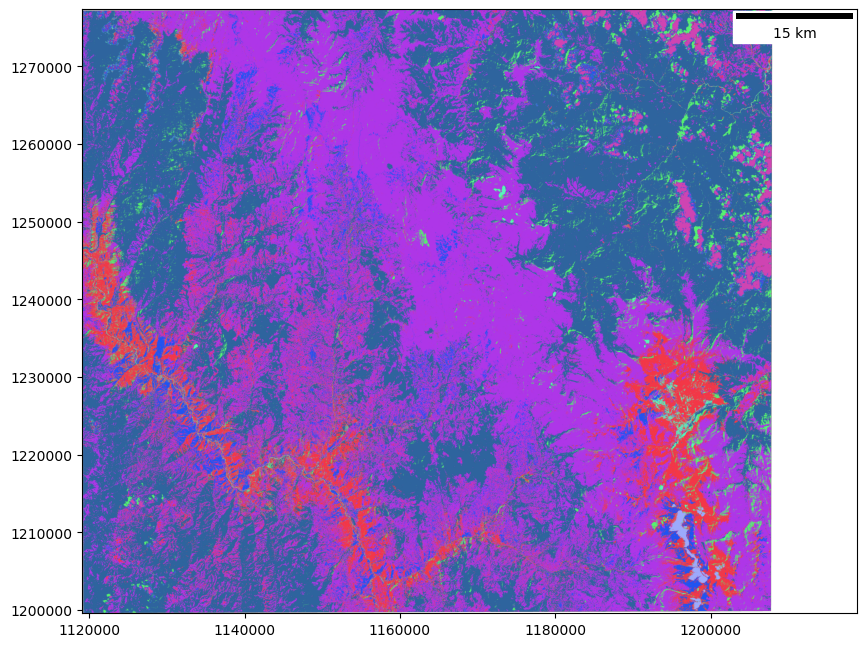

In [20]:
# Create the matplotlib figure
fig, ax = plt.subplots(figsize=(10, 10))

rsgislib.tools.mapping.create_thematic_raster_map(ax, out_cls_img)

## Visualización de los subgrupos

In [15]:
out_cls_img = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_cls.kea"
sub_img_bbox = [1119040.0, 1218820.0, 1199590.0, 1277360.0]

Image Data Size: 9978 x 7777
Image Data Size: 9978 x 7777


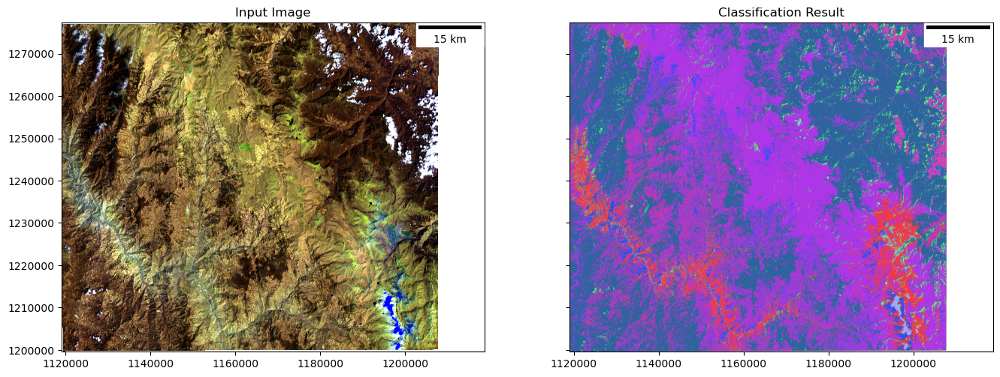

In [5]:
# Define a bbox for the subset to be displayed
sub_img_bbox = [1119040.0, 1218820.0, 1199590.0, 1277360.0]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

rsgislib.tools.mapping.create_raster_img_map(
    ax1,
    input_img,
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.title.set_text("Input Image")

rsgislib.tools.mapping.create_thematic_raster_map(ax2, out_cls_img, bbox=sub_img_bbox)
ax2.title.set_text("Classification Result")

## Creación de la leyenda

A partir de las clases obtenidas, es posible generar una leyenda sobre la calsifiación generada en la imagen.


Max. characters in class name: 30
Column width: 192
Image: 396 x  106


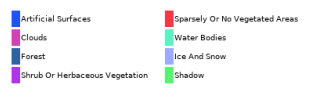

In [16]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.plotting as rsg_plot

cls_info = rsg_plot.create_legend_info_dict(
    out_cls_img,
    cls_names_col="class_names",
    use_title_case=True,
    underscore_to_space=True,
)

font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

fig, ax = plt.subplots(figsize=(4, 4))

rsg_plot.create_legend_img_mpl_ax(
    ax,
    legend_info=cls_info,
    n_cols=2,
    font=font_path,
    font_size=10
)

plt.show()


## Visualización de los mapas y la leyenda

Image Data Size: 9978 x 7777
Image Data Size: 9978 x 7777
Max. characters in class name: 30
Column width: 192
Image: 396 x  106


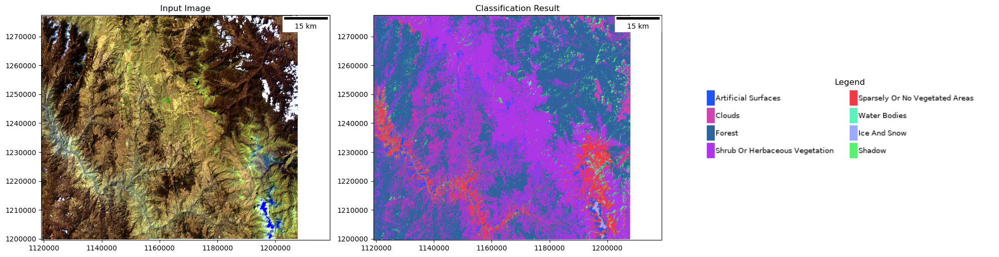

In [5]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.mapping as rsg_map
import rsgislib.tools.plotting as rsg_plot

font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8), sharey=False)

rsg_map.create_raster_img_map(
    ax1,
    input_img, 
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.set_title("Input Image")

rsg_map.create_thematic_raster_map(
    ax2,
    out_cls_img,
    bbox=sub_img_bbox
)
ax2.set_title("Classification Result")

rsg_plot.create_legend_img_mpl_ax(
    ax3,
    legend_info=cls_info,
    n_cols=2, 
    font=font_path,
    font_size=10
)
ax3.set_title("Legend")

plt.tight_layout()
plt.show()


# Estimación de metricas de precisión

Para este paso se hace uso de una capa de puntos de validación.

In [17]:
vec_file = "/notebooks/Primer_Parcial/descargas_gee/centroides1.gpkg"
vec_lyr = "centroides"

Creación de los directorios de salida

In [18]:
out_pts_dir = "acc_pts"
if not os.path.exists(out_pts_dir):
    os.mkdir(out_pts_dir)
    
out_stats_dir = "acc_stats"
if not os.path.exists(out_stats_dir):
    os.mkdir(out_stats_dir)

para evitar perdidas o daños en el archivo original, se crea un archiv auxiliar GeoJSON.

In [19]:
vec_refpts_file = os.path.join(out_pts_dir, "Puntos5.geojson")
vec_refpts_lyr = "centroides"

rsgislib.vectorutils.vector_translate(vec_file, vec_lyr, vec_refpts_file, vec_refpts_lyr, out_format="GeoJSON", del_exist_vec=True)

Deleting: acc_pts/Puntos5.geojson


  1%|▊                                                                                  | 1/100 [00:00<00:08, 12.05it/s]


### Visualización de los puntos de referencia sobre la imagen


In [20]:
rsgislib.classification.pop_class_info_accuracy_pts(
    input_img=out_cls_img,
    vec_file=vec_refpts_file,
    vec_lyr=vec_refpts_lyr,
    rat_class_col="class_names",
    vec_class_col="et_rl_cls",
    vec_ref_col=None,
    vec_process_col=None,
)

Image Data Size: 9978 x 7777


<Axes: >

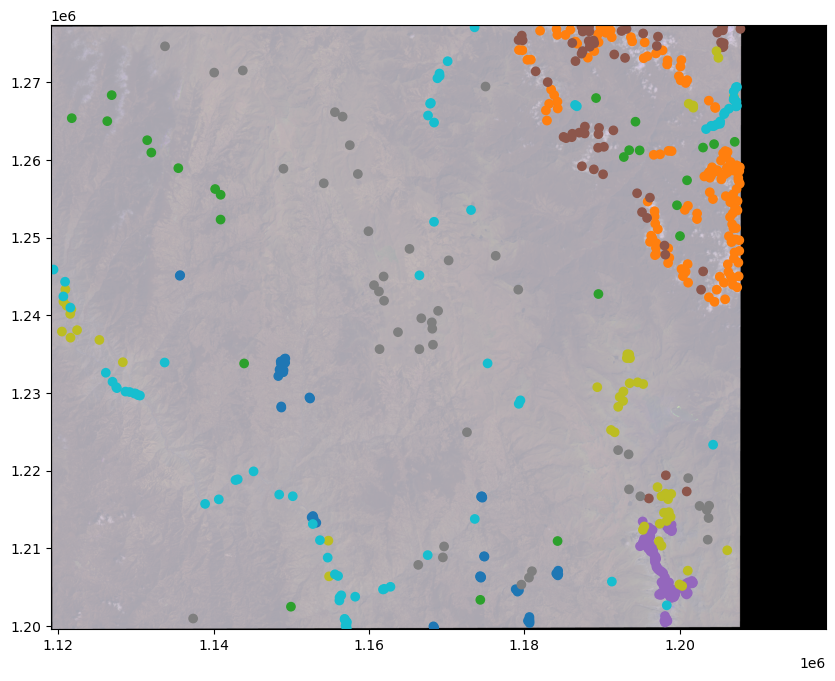

In [8]:
# Read image data
img_data, img_coords = rsgislib.tools.plotting.get_gdal_raster_mpl_imshow(
    input_img, bands=[8, 9, 3]
)

# Stretch the image data so is visualises appropriately and usefully
# In this case the resulting values will be between 0-1.
img_data_strch = rsgislib.tools.plotting.stdev_stretch_np_arr(img_data, no_data_val=0.0)

# Create a plot using the matplotlib library
fig, ax = plt.subplots(figsize=(10, 10))
# Add the stretched image data to the plot and define the spatial
# extent so the axis labels are the coordinates.
ax.imshow(img_data_strch, extent=img_coords)

# Read points to geopandas dataframe
points_gdf = geopandas.read_file(vec_refpts_file)
points_gdf 



# Plot the plots over the image data
# Note. Points are randomly coloured by reference class
points_gdf.plot(ax=ax, column='Name')


### Relación de los puntos de referencia

En este paso se han vinculado los valores de clasifiación de la imagen a los puntos.


In [21]:
points_gdf = geopandas.read_file(vec_refpts_file)
points_gdf

,Name,et_rl_cls,geometry
0,artificial_surfaces,artificial_surfaces,POINT (1148813.897 1232802.524)
1,artificial_surfaces,artificial_surfaces,POINT (1148980.302 1232665.775)
2,artificial_surfaces,artificial_surfaces,POINT (1148793.576 1233215.517)
3,artificial_surfaces,artificial_surfaces,POINT (1148815.698 1233295.106)
4,artificial_surfaces,artificial_surfaces,POINT (1148681.783 1233753.089)
...,...,...,...
554,water_bodies,water_bodies,POINT (1175285.342 1233800.821)
555,water_bodies,sparsely_or_no_vegetated_areas,POINT (1166510.017 1245135.541)
556,water_bodies,shrub_or_herbaceous_vegetation,POINT (1168391.101 1252030.776)
557,water_bodies,water_bodies,POINT (1173155.084 1253543.23)


Para evitar datos vacios, se genera una imputación de aquellos puntos que esten vacios en su valor de referencia.


In [22]:
vec_refpts_vld_file = os.path.join(out_pts_dir, "cls_acc_assessment_pts_ref_vld.geojson")
vec_refpts_vld_lyr = "cls_acc_assessment_pts_ref_vld"
print(points_gdf )
points_gdf = points_gdf.drop(points_gdf[points_gdf["et_rl_cls"] == "NA"].index)
points_gdf.to_file(vec_refpts_vld_file, driver="GeoJSON")


                    Name                       et_rl_cls  \
0    artificial_surfaces             artificial_surfaces   
1    artificial_surfaces             artificial_surfaces   
2    artificial_surfaces             artificial_surfaces   
3    artificial_surfaces             artificial_surfaces   
4    artificial_surfaces             artificial_surfaces   
..                   ...                             ...   
554         water_bodies                    water_bodies   
555         water_bodies  sparsely_or_no_vegetated_areas   
556         water_bodies  shrub_or_herbaceous_vegetation   
557         water_bodies                    water_bodies   
558         water_bodies                    water_bodies   

                            geometry  
0    POINT (1148813.897 1232802.524)  
1    POINT (1148980.302 1232665.775)  
2    POINT (1148793.576 1233215.517)  
3    POINT (1148815.698 1233295.106)  
4    POINT (1148681.783 1233753.089)  
..                               ...  
554  P

In [11]:
# GeObtener valores unicos de la capa de puntos
print( points_gdf["Name"].unique())


['artificial_surfaces' 'clouds' 'forest' 'ice_and_snow' 'shadow'
 'shrub_or_herbaceous_vegetation' 'sparsely_or_no_vegetated_areas'
 'water_bodies']


Posteriormente, se realiza el calculo de algunas metricas de precisión sobre la clasifiación generada.


In [23]:
from rsgislib.classification.classaccuracymetrics import calc_acc_metrics_vecsamples_img


out_json_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.json")
out_csv_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.csv")

calc_acc_metrics_vecsamples_img(
    vec_file=vec_refpts_vld_file,
    vec_lyr=vec_refpts_vld_lyr,
    ref_col="Name",
    cls_col="et_rl_cls",
    cls_img=out_cls_img,
    img_cls_name_col="class_names",
    img_hist_col="Histogram",
    out_json_file=out_json_file,
    out_csv_file=out_csv_file,
)

{np.str_('artificial_surfaces'): {'precision': 0.896551724137931,
  'recall': 0.9811320754716981,
  'f1-score': 0.9369369369369369,
  'support': 53.0},
 np.str_('clouds'): {'precision': 1.0,
  'recall': 0.9928571428571429,
  'f1-score': 0.996415770609319,
  'support': 140.0},
 np.str_('forest'): {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 25.0},
 np.str_('ice_and_snow'): {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 106.0},
 np.str_('shadow'): {'precision': 0.9833333333333333,
  'recall': 0.9833333333333333,
  'f1-score': 0.9833333333333333,
  'support': 60.0},
 np.str_('shrub_or_herbaceous_vegetation'): {'precision': 0.975,
  'recall': 0.8666666666666667,
  'f1-score': 0.9176470588235294,
  'support': 45.0},
 np.str_('sparsely_or_no_vegetated_areas'): {'precision': 0.7333333333333333,
  'recall': 0.88,
  'f1-score': 0.8,
  'support': 50.0},
 np.str_('water_bodies'): {'precision': 0.9859154929577465,
  'recall': 0.875,
  'f1-score': 0.92715

In [24]:
import pprint
cls_acc_stats_dict = rsgislib.tools.utils.read_json_to_dict(out_json_file)
pprint.pprint(cls_acc_stats_dict)

{'accuracy': 0.9552772808586762,
 'accuracy_conf_interval': [0.014337280072240745,
                            0.017134798135116987,
                            0.020369428395317645,
                            0.02255498938193971],
 'artificial_surfaces': {'f1-score': 0.9369369369369369,
                         'precision': 0.896551724137931,
                         'recall': 0.9811320754716981,
                         'support': 53.0},
 'bal_accuracy_score': 0.9473736522911052,
 'class_area': {'artificial_surfaces': 350274300.0,
                'clouds': 94836100.0,
                'forest': 2785941900.0,
                'ice_and_snow': 11540300.0,
                'shadow': 168042300.0,
                'shrub_or_herbaceous_vegetation': 2686412500.0,
                'sparsely_or_no_vegetated_areas': 686445600.0,
                'water_bodies': 85734200.0},
 'clouds': {'f1-score': 0.996415770609319,
            'precision': 1.0,
            'recall': 0.9928571428571429,
            

### Aplicación de otro modelo

Para este caso se aplicara el modelo de K-neighbor nearest 


In [37]:
from sklearn.neighbors import KNeighborsClassifier
import rsgislib.classification.classsklearn as rsg_sklearn


In [38]:
param_grid = {
    "n_neighbors": [3, 5, 7, 9],
    "weights": ["uniform", "distance"]
}
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)


In [39]:
best_knn_classifier = rsg_sklearn.perform_sklearn_classifier_param_search(
    cls_smpls_fnl_info, grid_search
)


Training data size: 434 x 9
Best score was 0.9468858593958835 and has parameters {'n_neighbors': 3, 'weights': 'distance'}.


In [41]:
rsg_sklearn.train_sklearn_classifier(cls_smpls_fnl_info, best_knn_classifier)

Training data size: 2857 x 9
Testing data size: 436 x 9
Training Classifier
Completed
Calc Classifier Accuracy
Classifier Train Score = 100.0%
Classifier Test Score = 98.39%


(1.0, 0.9839449541284404)

In [43]:
out_cls_img = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_cls_knn.kea"
out_scr_img = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_scr_knn.kea"

rsgislib.classification.classsklearn.apply_sklearn_classifier(
    cls_smpls_fnl_info,     # 1. Información de clases
    best_knn_classifier,         # 2. Clasificador entrenado
    in_msk_img,             # 3. Imagen de máscara
    1,                      # 4. Valor de máscara válido
    img_band_info,          # 5. Información de bandas
    out_cls_img,            # 6. Ruta de salida clasificación
    "KEA",                  # 7. Formato GDAL
    True,                   # 8. Incluir nombres de clases
    out_scr_img             # 9. Ruta de salida para imagen de score
)



Applying the Classifier


  0%|          | 0/100 [00:00<?, ?it/s]

Completed
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Calculating Image Pyramids.








Apply Colour to class 'artificial_surfaces'
Apply Colour to class 'forest'
Apply Colour to class 'shrub_or_herbaceous_vegetation'
Apply Colour to class 'sparsely_or_no_vegetated_areas'
Apply Colour to class 'water_bodies'
Apply Colour to class 'shadow'
Apply Colour to class 'clouds'
Apply Colour to class 'ice_and_snow'


Image Data Size: 9978 x 7777


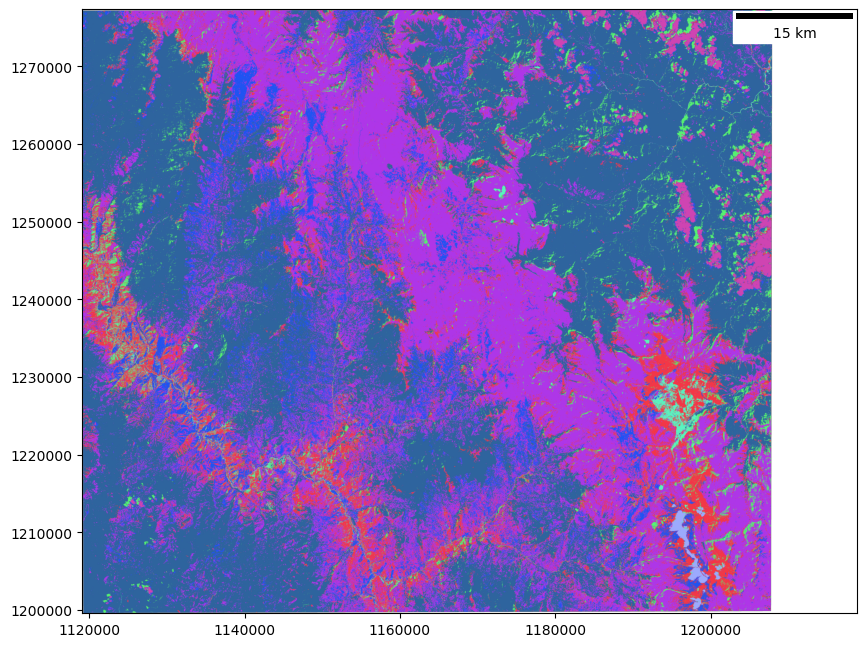

In [44]:
# Create the matplotlib figure
fig, ax = plt.subplots(figsize=(10, 10))

rsgislib.tools.mapping.create_thematic_raster_map(ax, '/notebooks/Primer_Parcial/Sentinel_Santander_20201_cls_knn.kea')

In [4]:
out_cls_img1 = "/notebooks/Primer_Parcial/Sentinel_Santander_20201_cls_knn.kea"
sub_img_bbox = [1119040.0, 1218820.0, 1199590.0, 1277360.0]

Image Data Size: 9978 x 7777
Image Data Size: 9978 x 7777


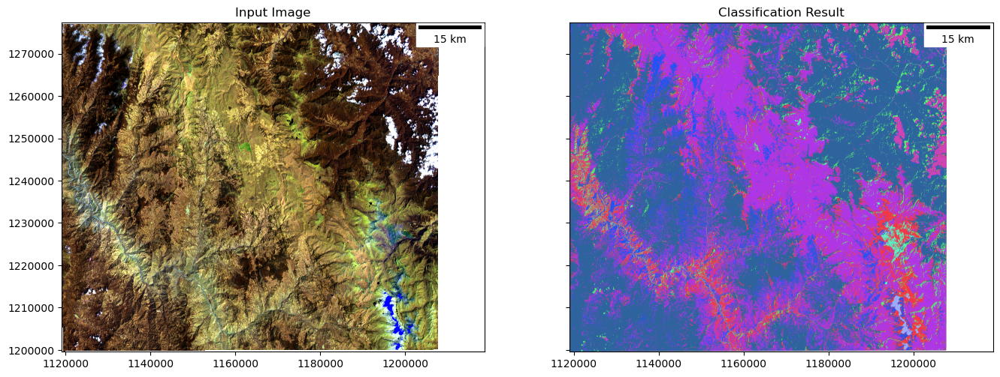

In [4]:
# Define a bbox for the subset to be displayed
sub_img_bbox = [1119040.0, 1218820.0, 1199590.0, 1277360.0]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

rsgislib.tools.mapping.create_raster_img_map(
    ax1,
    input_img,
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.title.set_text("Input Image")

rsgislib.tools.mapping.create_thematic_raster_map(ax2, out_cls_img1, bbox=sub_img_bbox)
ax2.title.set_text("Classification Result")

Max. characters in class name: 30
Column width: 192
Image: 396 x  106


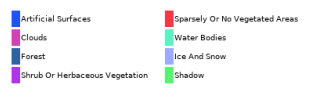

In [5]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.plotting as rsg_plot

cls_info = rsg_plot.create_legend_info_dict(
    out_cls_img1,
    cls_names_col="class_names",
    use_title_case=True,
    underscore_to_space=True,
)

font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

fig, ax = plt.subplots(figsize=(4, 4))

rsg_plot.create_legend_img_mpl_ax(
    ax,
    legend_info=cls_info,
    n_cols=2,
    font=font_path,
    font_size=10
)

plt.show()


Image Data Size: 9978 x 7777
Image Data Size: 9978 x 7777
Max. characters in class name: 30
Column width: 192
Image: 396 x  106


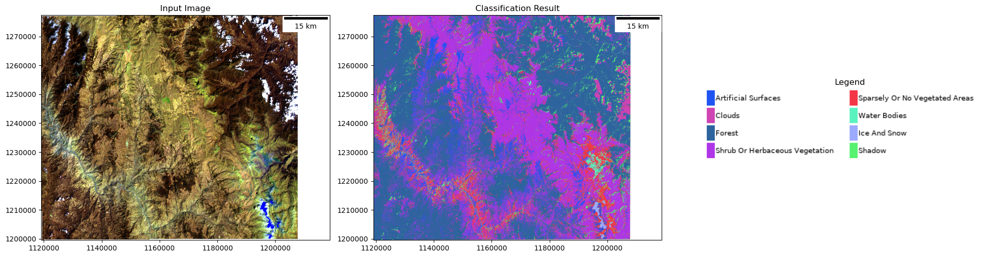

In [6]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.mapping as rsg_map
import rsgislib.tools.plotting as rsg_plot

font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8), sharey=False)

rsg_map.create_raster_img_map(
    ax1,
    input_img, 
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.set_title("Input Image")

rsg_map.create_thematic_raster_map(
    ax2,
    out_cls_img1,
    bbox=sub_img_bbox
)
ax2.set_title("Classification Result")

rsg_plot.create_legend_img_mpl_ax(
    ax3,
    legend_info=cls_info,
    n_cols=2, 
    font=font_path,
    font_size=10
)
ax3.set_title("Legend")

plt.tight_layout()
plt.show()


In [7]:
vec_file1 = "/notebooks/Primer_Parcial/descargas_gee/centroides1.gpkg"
vec_lyr1 = "centroides"


In [8]:
out_pts_dir = "acc_pts1"
if not os.path.exists(out_pts_dir):
    os.mkdir(out_pts_dir)
    
out_stats_dir = "acc_stats1"
if not os.path.exists(out_stats_dir):
    os.mkdir(out_stats_dir)


In [9]:
vec_refpts_file1 = os.path.join(out_pts_dir, "Puntos6.geojson")
vec_refpts_lyr1 = "centroides"

rsgislib.vectorutils.vector_translate(vec_file1, vec_lyr1, vec_refpts_file1, vec_refpts_lyr1, out_format="GeoJSON", del_exist_vec=True)


Deleting: acc_pts1/Puntos6.geojson


  1%|▊                                                                                  | 1/100 [00:00<00:10,  9.46it/s]


In [10]:
rsgislib.classification.pop_class_info_accuracy_pts(
    input_img=out_cls_img1,
    vec_file=vec_refpts_file1,
    vec_lyr=vec_refpts_lyr1,
    rat_class_col="class_names",
    vec_class_col="et_rl_cls",
    vec_ref_col=None,
    vec_process_col=None,
)


Image Data Size: 9978 x 7777


<Axes: >

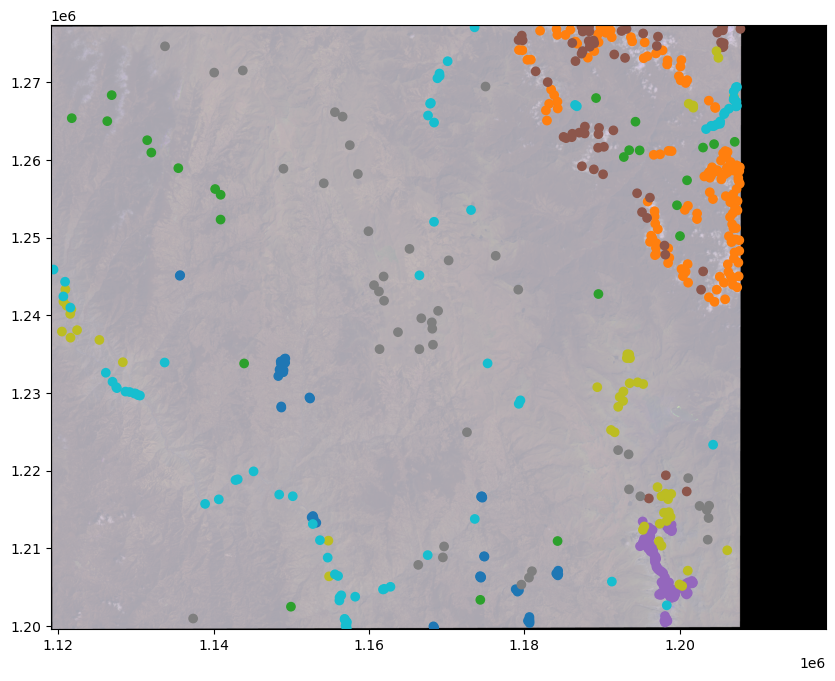

In [9]:
# Read image data
img_data, img_coords = rsgislib.tools.plotting.get_gdal_raster_mpl_imshow(
    input_img, bands=[8, 9, 3]
)

# Stretch the image data so is visualises appropriately and usefully
# In this case the resulting values will be between 0-1.
img_data_strch = rsgislib.tools.plotting.stdev_stretch_np_arr(img_data, no_data_val=0.0)

# Create a plot using the matplotlib library
fig, ax = plt.subplots(figsize=(10, 10))
# Add the stretched image data to the plot and define the spatial
# extent so the axis labels are the coordinates.
ax.imshow(img_data_strch, extent=img_coords)

# Read points to geopandas dataframe
points_gdf = geopandas.read_file(vec_refpts_file1)
points_gdf 



# Plot the plots over the image data
# Note. Points are randomly coloured by reference class
points_gdf.plot(ax=ax, column='Name')

In [11]:
points_gdf = geopandas.read_file(vec_refpts_file1)
points_gdf


,Name,et_rl_cls,geometry
0,artificial_surfaces,artificial_surfaces,POINT (1148813.897 1232802.524)
1,artificial_surfaces,artificial_surfaces,POINT (1148980.302 1232665.775)
2,artificial_surfaces,artificial_surfaces,POINT (1148793.576 1233215.517)
3,artificial_surfaces,artificial_surfaces,POINT (1148815.698 1233295.106)
4,artificial_surfaces,artificial_surfaces,POINT (1148681.783 1233753.089)
...,...,...,...
554,water_bodies,water_bodies,POINT (1175285.342 1233800.821)
555,water_bodies,sparsely_or_no_vegetated_areas,POINT (1166510.017 1245135.541)
556,water_bodies,shrub_or_herbaceous_vegetation,POINT (1168391.101 1252030.776)
557,water_bodies,water_bodies,POINT (1173155.084 1253543.23)


In [12]:
vec_refpts_vld_file = os.path.join(out_pts_dir, "cls_acc_assessment_pts_ref_vld.geojson")
vec_refpts_vld_lyr = "cls_acc_assessment_pts_ref_vld"
print(points_gdf )
points_gdf = points_gdf.drop(points_gdf[points_gdf["et_rl_cls"] == "NA"].index)
points_gdf.to_file(vec_refpts_vld_file, driver="GeoJSON")


                    Name                       et_rl_cls  \
0    artificial_surfaces             artificial_surfaces   
1    artificial_surfaces             artificial_surfaces   
2    artificial_surfaces             artificial_surfaces   
3    artificial_surfaces             artificial_surfaces   
4    artificial_surfaces             artificial_surfaces   
..                   ...                             ...   
554         water_bodies                    water_bodies   
555         water_bodies  sparsely_or_no_vegetated_areas   
556         water_bodies  shrub_or_herbaceous_vegetation   
557         water_bodies                    water_bodies   
558         water_bodies                    water_bodies   

                            geometry  
0    POINT (1148813.897 1232802.524)  
1    POINT (1148980.302 1232665.775)  
2    POINT (1148793.576 1233215.517)  
3    POINT (1148815.698 1233295.106)  
4    POINT (1148681.783 1233753.089)  
..                               ...  
554  P

In [13]:
from rsgislib.classification.classaccuracymetrics import calc_acc_metrics_vecsamples_img


out_json_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info1.json")
out_csv_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info1.csv")

calc_acc_metrics_vecsamples_img(
    vec_file=vec_refpts_vld_file,
    vec_lyr=vec_refpts_vld_lyr,
    ref_col="Name",
    cls_col="et_rl_cls",
    cls_img=out_cls_img1,
    img_cls_name_col="class_names",
    img_hist_col="Histogram",
    out_json_file=out_json_file,
    out_csv_file=out_csv_file,
)

{np.str_('artificial_surfaces'): {'precision': 0.9285714285714286,
  'recall': 0.9811320754716981,
  'f1-score': 0.9541284403669725,
  'support': 53.0},
 np.str_('clouds'): {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 140.0},
 np.str_('forest'): {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 25.0},
 np.str_('ice_and_snow'): {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 106.0},
 np.str_('shadow'): {'precision': 0.9836065573770492,
  'recall': 1.0,
  'f1-score': 0.9917355371900827,
  'support': 60.0},
 np.str_('shrub_or_herbaceous_vegetation'): {'precision': 0.9777777777777777,
  'recall': 0.9777777777777777,
  'f1-score': 0.9777777777777777,
  'support': 45.0},
 np.str_('sparsely_or_no_vegetated_areas'): {'precision': 0.8518518518518519,
  'recall': 0.92,
  'f1-score': 0.8846153846153846,
  'support': 50.0},
 np.str_('water_bodies'): {'precision': 1.0,
  'recall': 0.9,
  'f1-score': 0.9473684210526315,
  'support': 80.0},

In [14]:
import pprint
cls_acc_stats_dict = rsgislib.tools.utils.read_json_to_dict(out_json_file)
pprint.pprint(cls_acc_stats_dict)

{'accuracy': 0.9749552772808586,
 'accuracy_conf_interval': [0.010838979757007497,
                            0.012953902636423594,
                            0.015399282215748458,
                            0.017051565715292285],
 'artificial_surfaces': {'f1-score': 0.9541284403669725,
                         'precision': 0.9285714285714286,
                         'recall': 0.9811320754716981,
                         'support': 53.0},
 'bal_accuracy_score': 0.9723637316561845,
 'class_area': {'artificial_surfaces': 511728200.0,
                'clouds': 97084300.0,
                'forest': 3145894900.0,
                'ice_and_snow': 12303000.0,
                'shadow': 196016700.0,
                'shrub_or_herbaceous_vegetation': 2148918400.0,
                'sparsely_or_no_vegetated_areas': 657372800.0,
                'water_bodies': 99908900.0},
 'clouds': {'f1-score': 1.0, 'precision': 1.0, 'recall': 1.0, 'support': 140.0},
 'cls_confidence_intervals': {'artificial_su

### Comparación de metricas

En esta parte, se detallan las difreencias de los resultados de los modelos de RF y KNN.


In [28]:
import json
import pandas as pd

# Leer resultados JSON del RF
with open("/notebooks/Primer_Parcial/acc_stats/cls_rf_refl_acc_info.json", "r") as rf_file:
    rf_results = json.load(rf_file)

# Leer resultados JSON del KNN
with open("/notebooks/Primer_Parcial/acc_stats1/cls_rf_refl_acc_info1.json", "r") as knn_file:
    knn_results = json.load(knn_file)

# Comparar métricas clave
print("Accuracy RF:", rf_results["accuracy"])
print("Accuracy KNN:", knn_results["accuracy"])

print("\nKappa RF:", rf_results["cohen_kappa"])
print("Kappa KNN:", knn_results["cohen_kappa"])

print("\nF1-score forest (RF):", rf_results["forest"]["f1-score"])
print("F1-score forest (KNN):", knn_results["forest"]["f1-score"])


Accuracy RF: 0.9552772808586762
Accuracy KNN: 0.9749552772808586

Kappa RF: 0.9470655969940077
Kappa KNN: 0.9703456141746903

F1-score forest (RF): 1.0
F1-score forest (KNN): 1.0


In [29]:
import json
import pandas as pd

with open("/notebooks/Primer_Parcial/acc_stats/cls_rf_refl_acc_info.json", "r") as rf_file:
    rf_results = json.load(rf_file)

with open("/notebooks/Primer_Parcial/acc_stats1/cls_rf_refl_acc_info1.json", "r") as knn_file:
    knn_results = json.load(knn_file)

general_metrics = {
    "Accuracy": [rf_results["accuracy"], knn_results["accuracy"]],
    "Cohen Kappa": [rf_results["cohen_kappa"], knn_results["cohen_kappa"]],
    "Matthews Corr": [rf_results["matthews_corrcoef"], knn_results["matthews_corrcoef"]],
    "Balanced Accuracy": [rf_results["bal_accuracy_score"], knn_results["bal_accuracy_score"]],
}
df_general = pd.DataFrame(general_metrics, index=["Random Forest", "KNN"])
display(df_general)

# Comparación por clase
classes = [c for c in rf_results.keys() if isinstance(rf_results[c], dict) and "precision" in rf_results[c]]

data = []
for cls in classes:
    rf_cls = rf_results[cls]
    knn_cls = knn_results[cls]
    data.append({
        "Class": cls,
        "RF Precision": rf_cls["precision"],
        "RF Recall": rf_cls["recall"],
        "RF F1": rf_cls["f1-score"],
        "KNN Precision": knn_cls["precision"],
        "KNN Recall": knn_cls["recall"],
        "KNN F1": knn_cls["f1-score"]
    })

df_by_class = pd.DataFrame(data)
display(df_by_class)


,Accuracy,Cohen Kappa,Matthews Corr,Balanced Accuracy
Random Forest,0.955277,0.947066,0.947482,0.947374
KNN,0.974955,0.970346,0.970511,0.972364


,Class,RF Precision,RF Recall,RF F1,KNN Precision,KNN Recall,KNN F1
0,artificial_surfaces,0.896552,0.981132,0.936937,0.928571,0.981132,0.954128
1,clouds,1.000000,0.992857,0.996416,1.000000,1.000000,1.000000
2,forest,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3,ice_and_snow,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
4,macro avg,0.946767,0.947374,0.945186,0.967726,0.972364,0.969453
5,shadow,0.983333,0.983333,0.983333,0.983607,1.000000,0.991736
6,shrub_or_herbaceous_vegetation,0.975000,0.866667,0.917647,0.977778,0.977778,0.977778
7,sparsely_or_no_vegetated_areas,0.733333,0.880000,0.800000,0.851852,0.920000,0.884615
8,water_bodies,0.985915,0.875000,0.927152,1.000000,0.900000,0.947368
9,weighted area avg,0.957716,0.932836,0.943225,0.973082,0.982532,0.977587


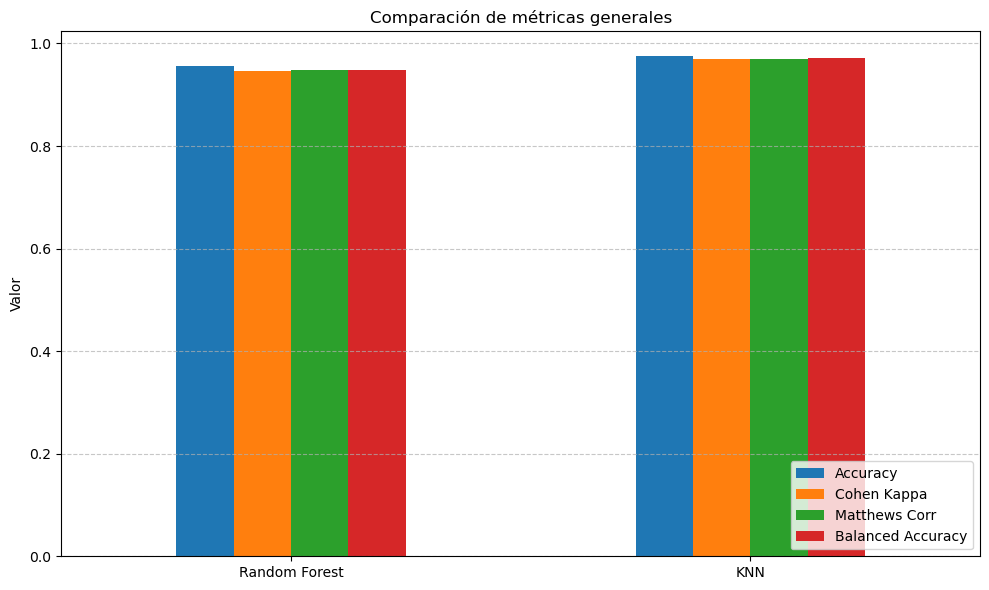

In [30]:
import matplotlib.pyplot as plt

df_general.plot(kind="bar", figsize=(10, 6))
plt.title("Comparación de métricas generales")
plt.ylabel("Valor")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()


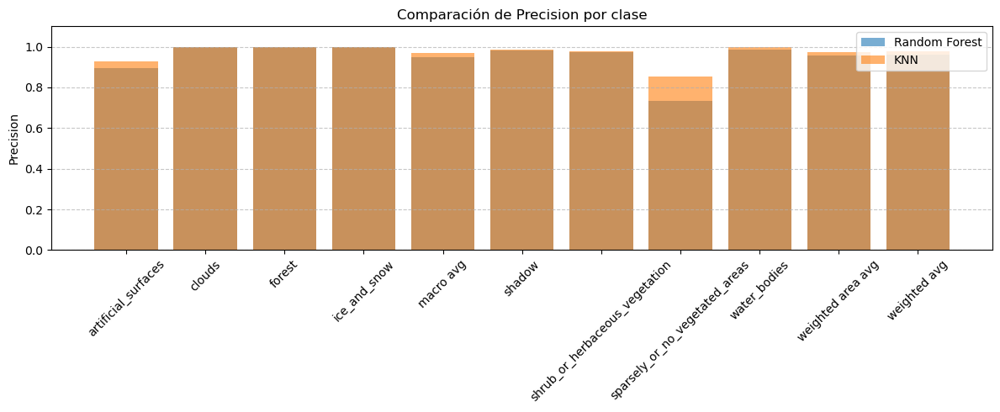

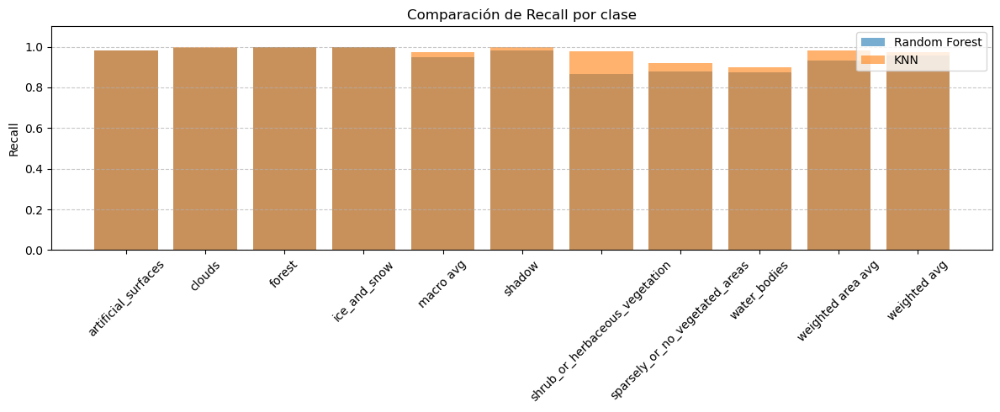

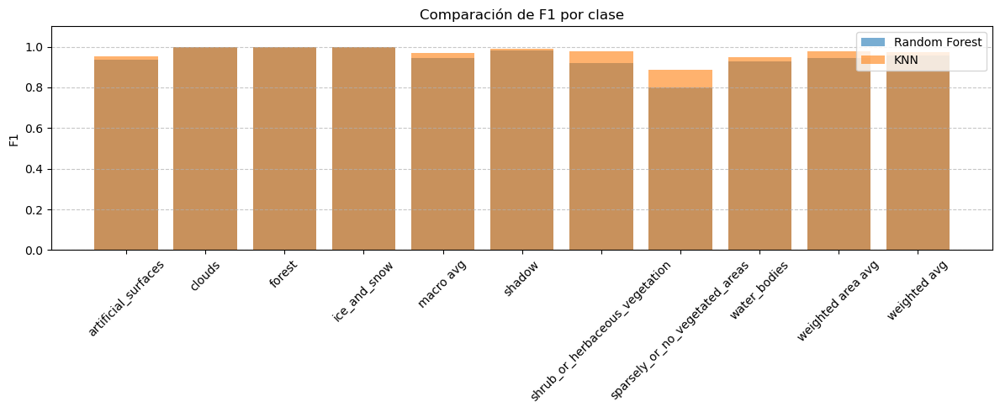

In [31]:
metrics = ["Precision", "Recall", "F1"]

for metric in metrics:
    plt.figure(figsize=(12, 5))
    plt.bar(df_by_class["Class"], df_by_class[f"RF {metric}"], alpha=0.6, label="Random Forest")
    plt.bar(df_by_class["Class"], df_by_class[f"KNN {metric}"], alpha=0.6, label="KNN")
    plt.title(f"Comparación de {metric} por clase")
    plt.xticks(rotation=45)
    plt.ylabel(metric)
    plt.ylim(0, 1.1)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [33]:
import pandas as pd

comparacion = {
    "accuracy": {
        "Random Forest": rf_results["accuracy"],
        "KNN": knn_results["accuracy"]
    },
    "cohen_kappa": {
        "Random Forest": rf_results["cohen_kappa"],
        "KNN": knn_results["cohen_kappa"]
    },
    "balanced_accuracy": {
        "Random Forest": rf_results["bal_accuracy_score"],
        "KNN": knn_results["bal_accuracy_score"]
    },
    "hamming_loss": {
        "Random Forest": rf_results["hamming_loss"],
        "KNN": knn_results["hamming_loss"]
    },
    "matthews_corrcoef": {
        "Random Forest": rf_results["matthews_corrcoef"],
        "KNN": knn_results["matthews_corrcoef"]
    },
    "weighted_f1": {
        "Random Forest": rf_results["weighted avg"]["f1-score"],
        "KNN": knn_results["weighted avg"]["f1-score"]
    },
    "weighted_precision": {
        "Random Forest": rf_results["weighted avg"]["precision"],
        "KNN": knn_results["weighted avg"]["precision"]
    },
    "weighted_recall": {
        "Random Forest": rf_results["weighted avg"]["recall"],
        "KNN": knn_results["weighted avg"]["recall"]
    }
}

df_comparacion = pd.DataFrame(comparacion).T
df_comparacion["Mejor Modelo"] = df_comparacion.apply(lambda row: "RF" if row["Random Forest"] > row["KNN"] else "KNN", axis=1)

print(df_comparacion)


                    Random Forest       KNN Mejor Modelo
accuracy                 0.955277  0.974955          KNN
cohen_kappa              0.947066  0.970346          KNN
balanced_accuracy        0.947374  0.972364          KNN
hamming_loss             0.044723  0.025045           RF
matthews_corrcoef        0.947482  0.970511          KNN
weighted_f1              0.956390  0.975122          KNN
weighted_precision       0.960523  0.976428          KNN
weighted_recall          0.955277  0.974955          KNN
